# Exploratory Analysis
## TODO: order and clean up!

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import cv2
from PIL import Image, ImageChops
import os

## Application Domain and Prior Knowledge

humpback_whale.jpg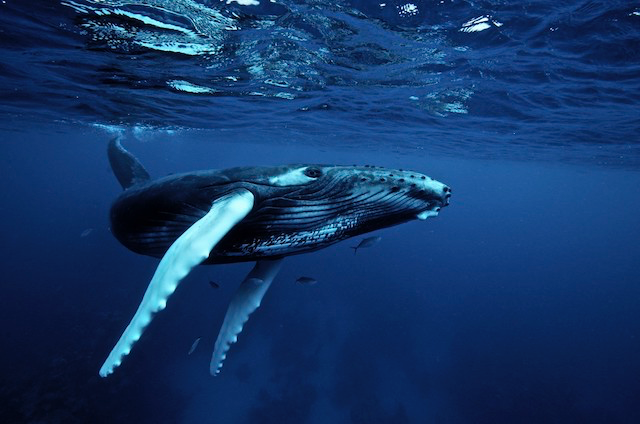

The whole animal has many usable visual features, but the dataset focuses on its tail (AKA fluke).

various_flukes.jpg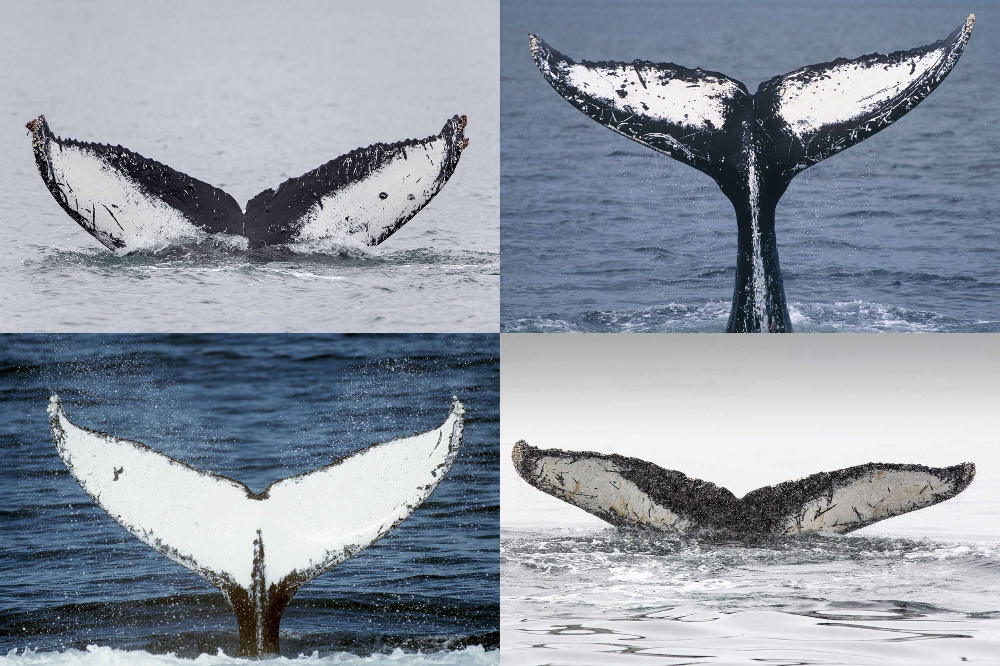

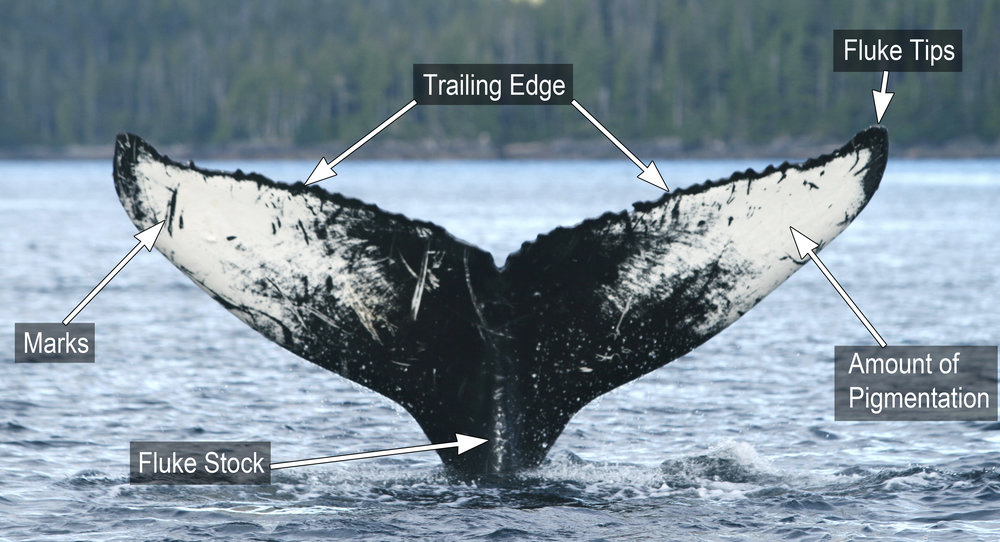

#### Possible Features
* Macro-geometry (shapes, proportions, etc)
* Micro-geometry (bumps, scratches, etc)
* Colors
* Color Patterns

## Image Corpus Exploration

ocluded.jpg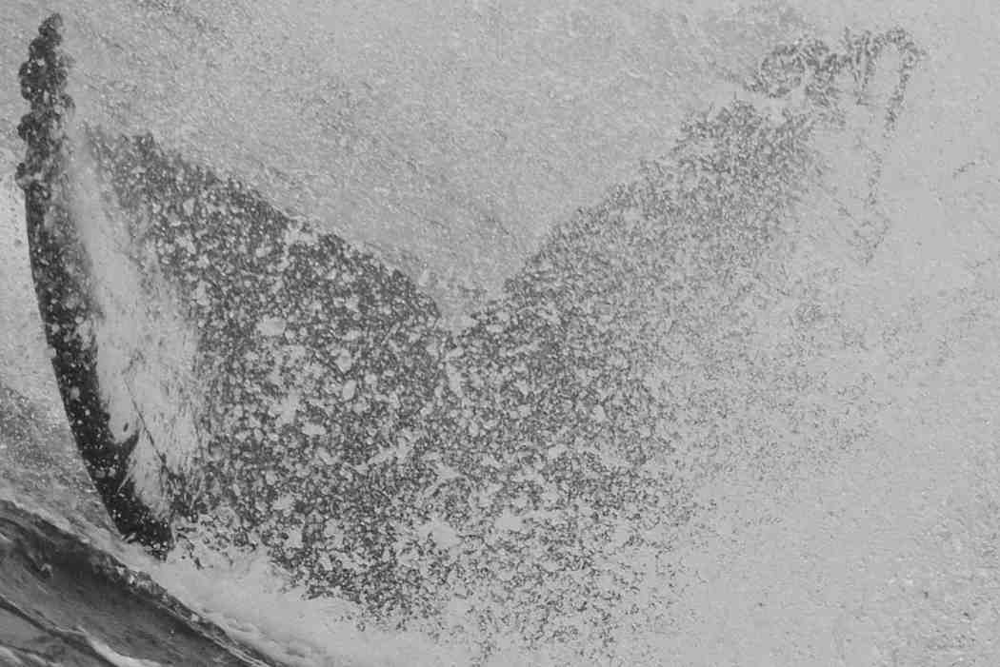

side_fluke.jpg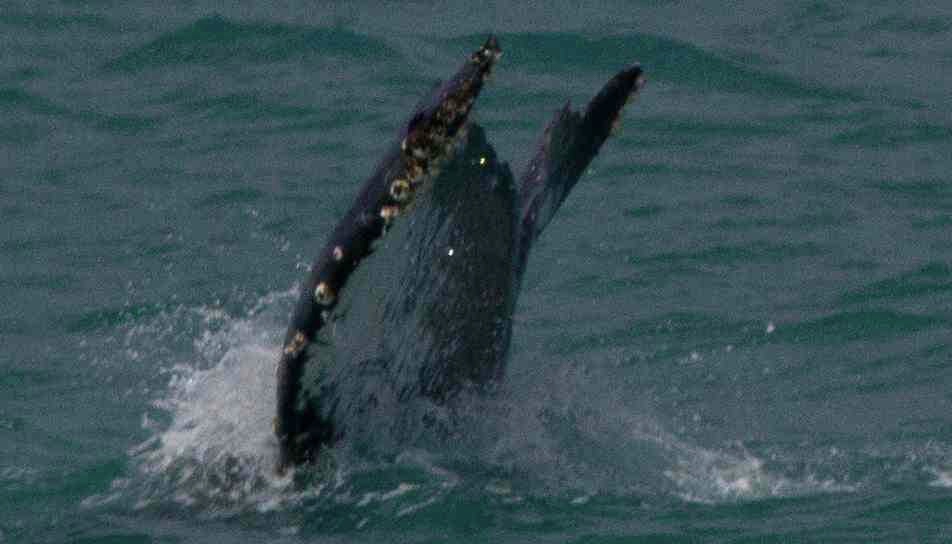

e6ce415f.jpg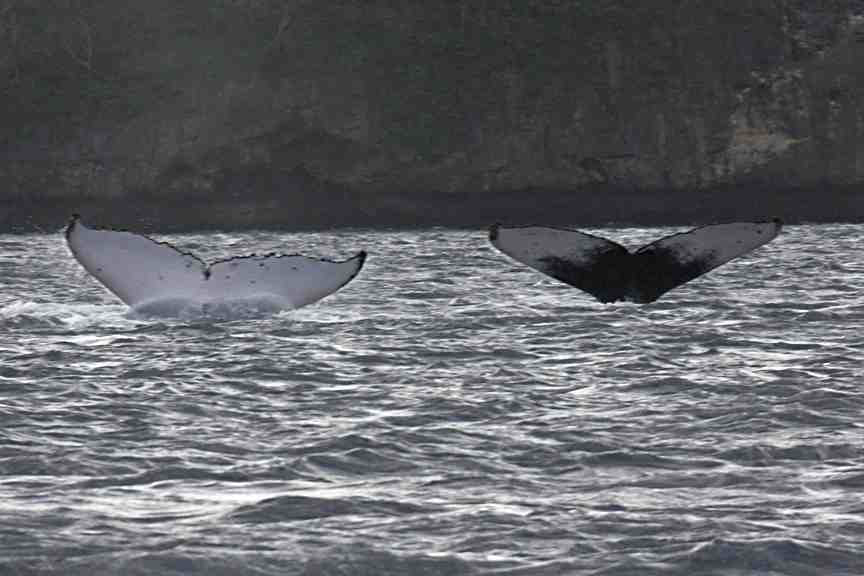

95226283.jpg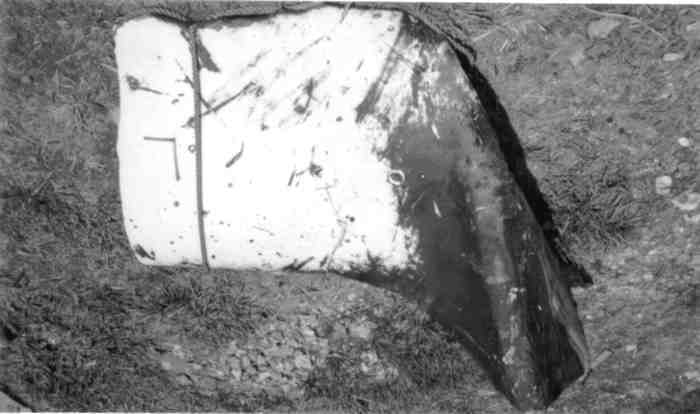

4dc3ac20.jpg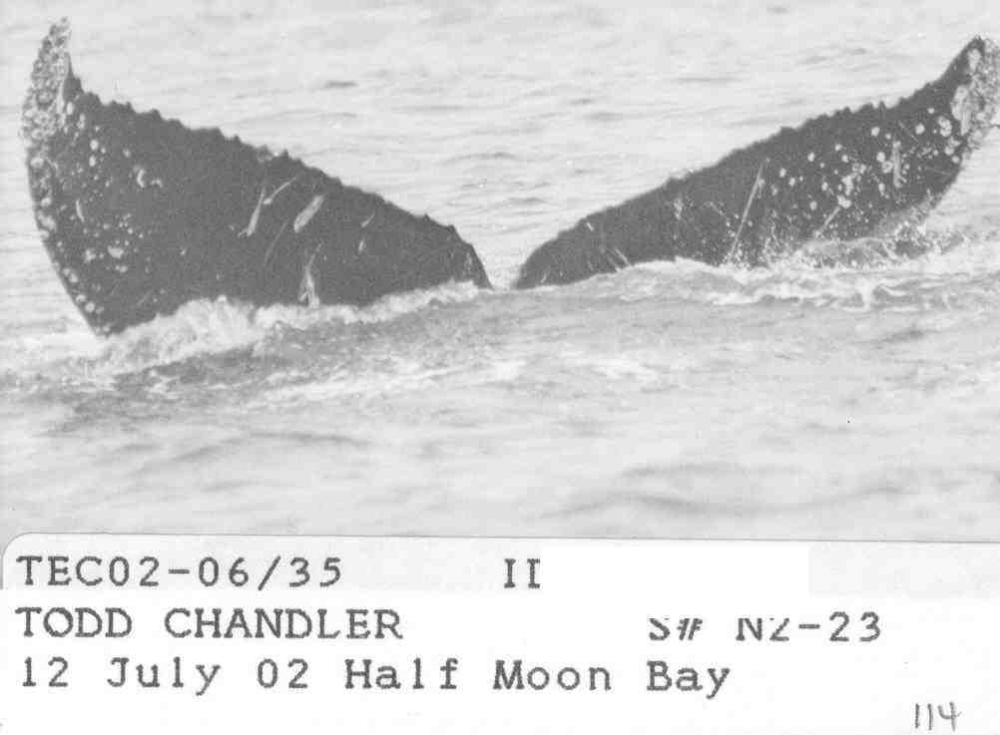

96b3fd19.jpg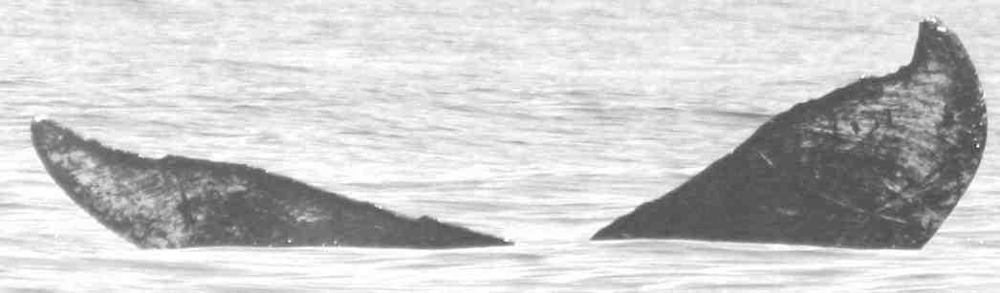

f767cdfa.jpg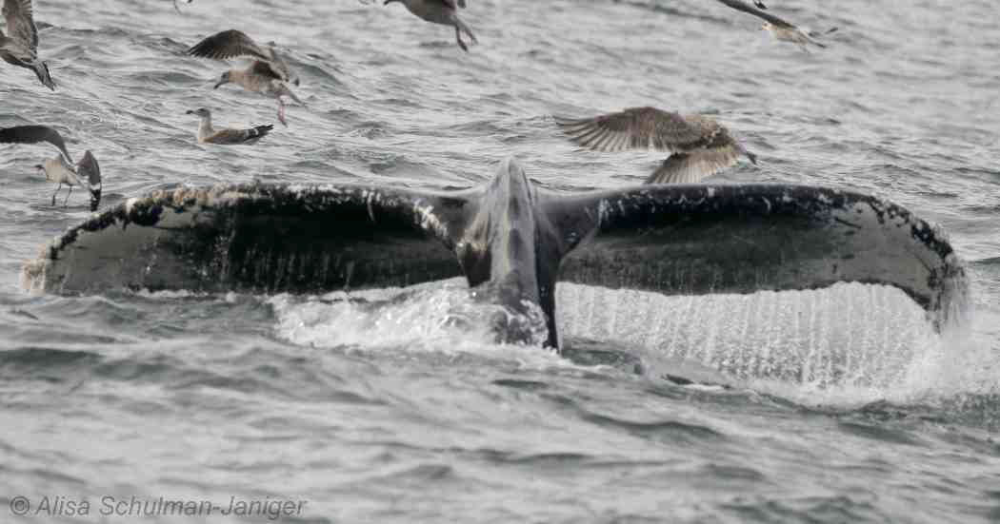

d5c9c1f2.jpg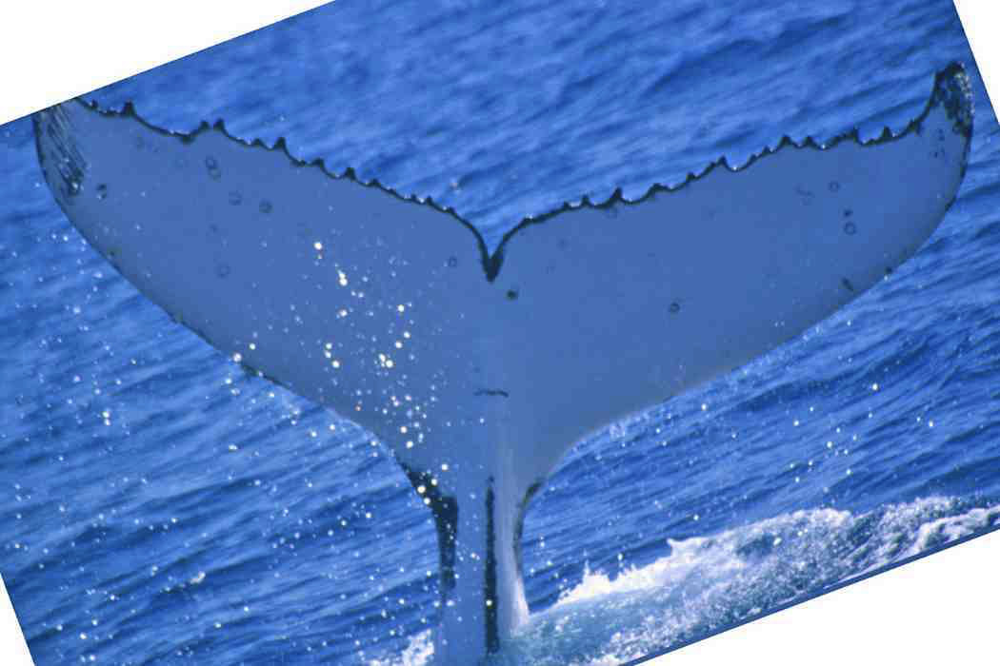

#### Challenging Samples
* Side views and various other uncommon view angles
* various partial and sometimes full occlusions
* variable zoom
* image deformations due to many different cameras and processing methods
* many different image resolutions
* some images are grayscale
* color images have many different color profiles
* a few non-whale images
* some images contain other overlapping animals or objects 
* great variety in color/light conditions
* some images have more than a single whale
* some RGB images are actually grayscale upchannled to RGB
* some images are wholly black and white
* some images are heavily tinted/distorted so as to indicate they're actually BGR/HSV/etc  

#### Image Attributes

In [166]:
TRAIN_DIR = './data/train/'
paths = [TRAIN_DIR + p for p in os.listdir(TRAIN_DIR)]

In [60]:
print('number of files in train dir: ', len(paths))

number of files in train dir:  25361


In [167]:
heights, widths, formats, modes = [],[],[],[]
for p in paths: 
    with Image.open(p) as im:
        heights.append(im.height)
        widths.append(im.width)
        formats.append(im.format)
        modes.append(im.mode)

In [63]:
print('number of images:', len(formats))

number of images:  25361


In [64]:
print('unique image formats:', set(formats))

unique image formats: {'JPEG'}


In [68]:
mvals, mcounts = np.unique(modes, return_counts=True)
print('unique image modes:', mvals, ' unique mode counts:', mcounts)

unique image modes: ['L' 'RGB']  unique mode counts: [ 3386 21975]


max image height: 1575


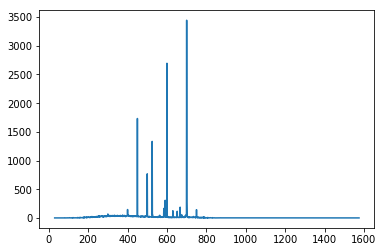

In [171]:
# plot image heights
hvals, hcounts = np.unique(heights, return_counts=True)
print('max image height:', hvals.max())
plt.plot(hvals, hcounts)

max image width: 5959


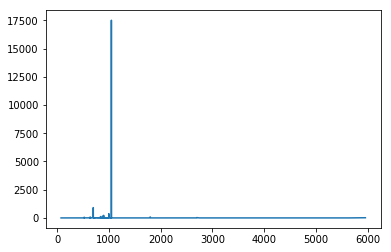

In [174]:
# plot image widths
wvals, wcounts = np.unique(widths, return_counts=True)
print('max image width:', wvals.max())
plt.plot(wvals, wcounts)

widest: 13.2613636364 tallest: 0.500866551127


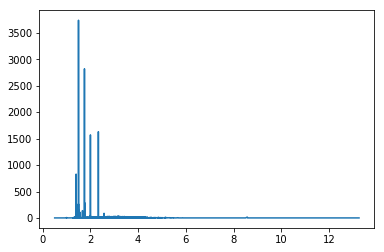

In [191]:
# aspect ratios
ratios,counts = np.unique([w/h for w,h in zip(widths,heights)], return_counts=True)
print('widest:', ratios.max(), 'tallest:', ratios.min())
plt.plot(ratios, counts)

In [112]:
# count images having no hue or no saturation
quasigray = 0
for p in paths[:1000]:
    with Image.open(p) as im:
        if im.mode == 'RGB':
            im_hsv = im.convert('HSV')
            hextr, sextr, vextr = im_hsv.getextrema()
            if hextr == (0,0) or sextr == (0,0):
                quasigray += 1
print(quasigray)

189


#### Observations
- all files in training dir are JPEG images
- majority of images are tri-channel (~90%)
- at most ~80% of tri-channel images are actual RGB
- monochrome or up-channeled (i.e 'fake' RGB) images are at least %30 of the training set
- vast majority of images have a width of ~1000px
- majority of image heights are ~400-800px
- image aspect ratio varies significantly

### Label Exploration

In [3]:
labels = pd.read_csv("./data/train.csv")

In [23]:
# number of labels
labels.count()

Image    25361
Id       25361
dtype: int64

In [194]:
known = labels.Id[labels.Id != 'new_whale'].value_counts()
print('number of unique known whales:', known.count())
print('average number of images per known whale:', known.mean())
print('median number of images per known whale:', known.median())

number of unique known whales: 5004
average number of images per known whale: 3.13689048761
median number of images per known whale: 2.0


In [201]:
print('known whales with only a single image:', known[known < 2].count())

known whales with only a single image: 2073


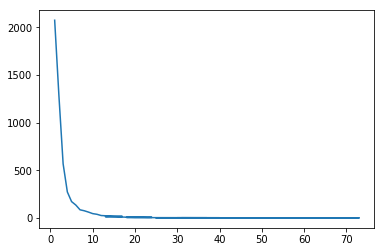

In [19]:
# distribution of number of images per known whale
known.value_counts().plot()

In [21]:
# number of samples labeled 'new_whale'
labels.Id[labels.Id == 'new_whale'].count()

9664

In [29]:
img_fnames = [p for p in os.listdir(TRAIN_DIR)]

In [38]:
# is there a label for each image?
img_fnames = [p for p in os.listdir(TRAIN_DIR)]
all(labels.Image.str.contains(name).any() for name in img_fnames)

True

In [164]:
# is there an image for each label?
all(name in img_fnames for name in labels.Image.unique())

True

In [160]:
# does each image belong to a single label?
len(labels.Image.unique()) == len(labels)

True

In [141]:
# top 3 ids having most images
mult_img_ids = labels.Id[labels.Id != 'new_whale'].value_counts().nlargest(3).keys()

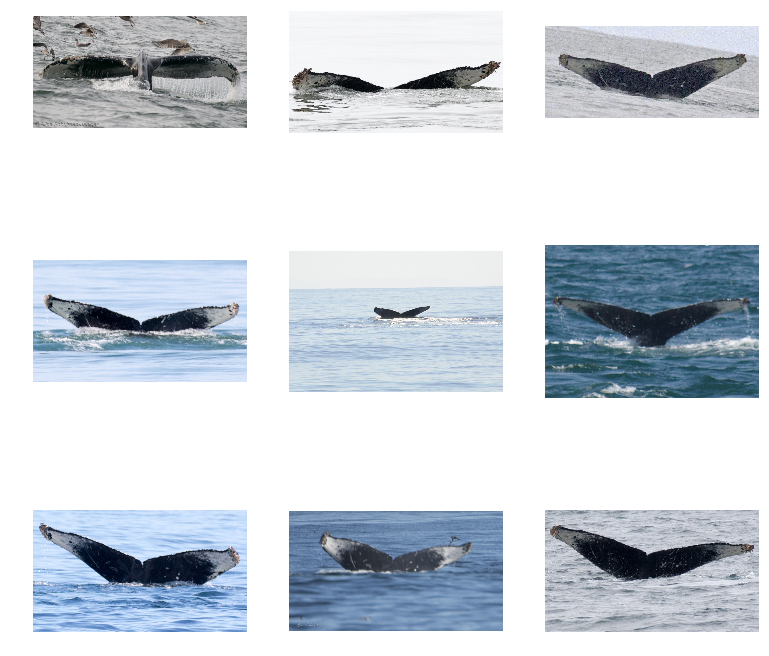

In [146]:
# showcase a few samples
top1_paths = [TRAIN_DIR + p for p in labels.Image[labels.Id == mult_img_ids[0]]][:9]
for ax,p in zip(plt.subplots(3,3,figsize=(13,13))[1].ravel(), top1_paths):
    ax.set_axis_off()
    ax.imshow(plt.imread(p))

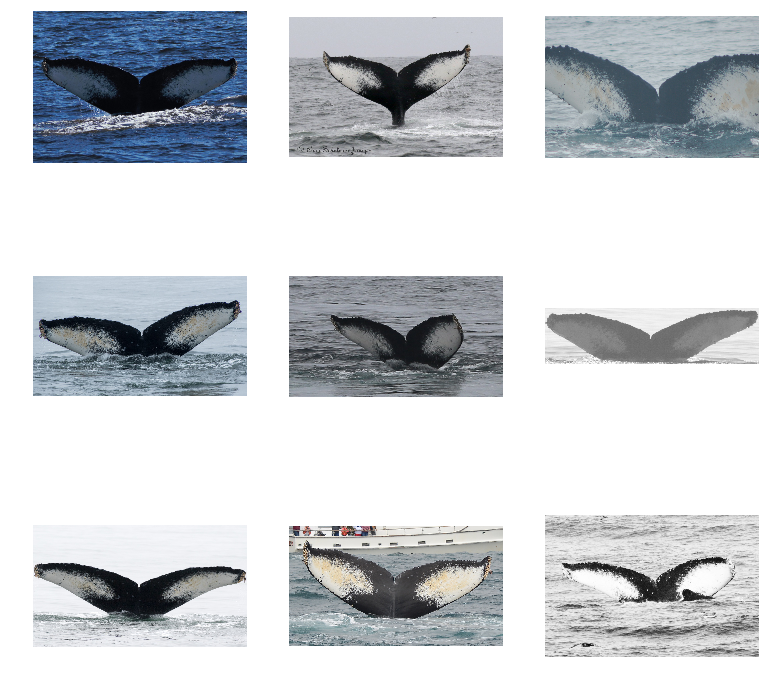

In [147]:
top2_paths = [TRAIN_DIR + p for p in labels.Image[labels.Id == mult_img_ids[1]]][:9]
for ax,p in zip(plt.subplots(3,3,figsize=(13,13))[1].ravel(), top2_paths):
    ax.set_axis_off()
    ax.imshow(plt.imread(p))

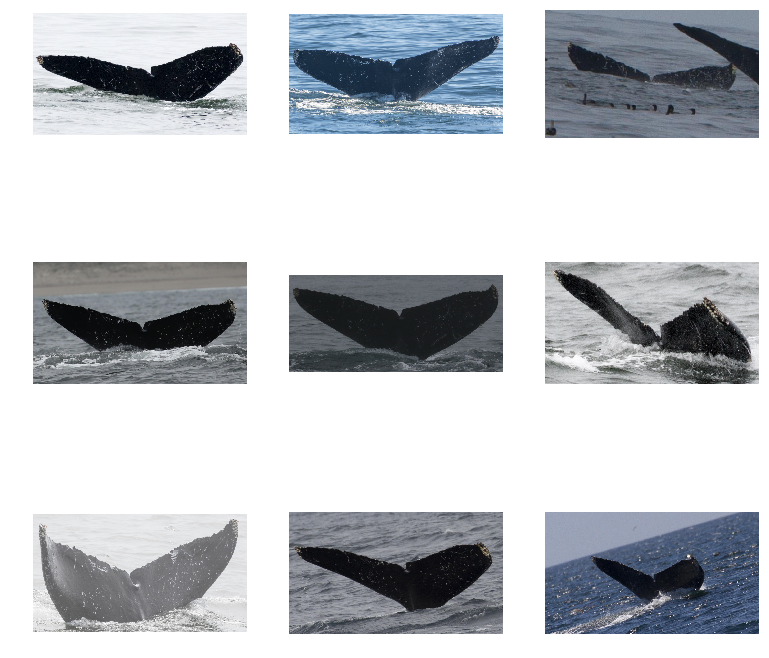

In [148]:
top3_paths = [TRAIN_DIR + p for p in labels.Image[labels.Id == mult_img_ids[2]]][:9]
for ax,p in zip(plt.subplots(3,3,figsize=(13,13))[1].ravel(), top3_paths):
    ax.set_axis_off()
    ax.imshow(plt.imread(p))